In [1]:
import numpy as np
import time
import os
import matplotlib.pyplot as plt

import datetime as dt
import tensorflow as tf

from tensorflow.keras.datasets import mnist, cifar10
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Activation, Dropout, Flatten,Reshape, LeakyReLU, BatchNormalization, UpSampling2D, Conv2D, Embedding, Concatenate, Multiply, Conv2DTranspose
from tensorflow.keras.optimizers import Adam

devices = tf.config.list_physical_devices('GPU')
tf.config.list_physical_devices('GPU')
tf.config.set_visible_devices(devices[0], 'GPU')

def bulid_generator(latent_dim, class_num, img_shape):
    noise = Input(shape=(latent_dim,))
    label = Input(shape=(class_num,), dtype='float32')

    # ラベルをくっつける
    model_input = Concatenate()([noise, label])

    size = img_shape[0] // 4

    hid = Dense(128 * size * size, activation="relu")(model_input)
    hid = Reshape((size, size, 128))(hid)
    hid = UpSampling2D()(hid)

    hid = Conv2D(128, kernel_size=3, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = Activation("relu")(hid)
    hid = UpSampling2D()(hid)

    hid = Conv2D(64, kernel_size=3, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = Activation("relu")(hid)

    hid = Conv2D(img_shape[2], kernel_size=3, padding="same")(hid)
    img = Activation("tanh")(hid)

    return Model([noise, label], img)

def build_discriminator(img_shape):
    img = Input(shape=img_shape)
    label = Input(shape=(class_num,), dtype='float32')

    hid = Conv2D(32, kernel_size=3, strides=2, padding="same")(img)
    hid = LeakyReLU(alpha=0.2)(hid)

    hid = Conv2D(64, kernel_size=3, strides=2, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = LeakyReLU(alpha=0.2)(hid)

    hid = Conv2D(128, kernel_size=3, strides=2, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = LeakyReLU(alpha=0.2)(hid)

    hid = Conv2D(256, kernel_size=3, strides=2, padding="same")(hid)
    hid = BatchNormalization(momentum=0.8)(hid)
    hid = LeakyReLU(alpha=0.2)(hid)
    hid = Flatten()(hid)

    # ラベルをマージ
    merge = Concatenate()([hid, label])

    hid = Dense(512, activation="relu")(merge)
    validity = Dense(1, activation="sigmoid")(hid)

    return Model([img, label], validity)

def label2onehot(labels, class_num):
    return np.identity(class_num)[labels.reshape(labels.shape[0])]

def train(train_data, train_labels):
    # -1 ～ 1に
    train_data = train_data.astype(np.float32) / 127.5 - 1.0
    print(train_data.shape, train_label.shape)

    # モデル
    generator = bulid_generator(latent_dim, class_num, train_data.shape[1:])
    discriminator = build_discriminator(train_data.shape[1:])

    # 最適化関数
    optimizer = Adam(0.0002, 0.5)

    # Discriminatorコンパイル
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

    # Generatorがノイズから画像を生成
    z = Input(shape=(latent_dim,))
    label = Input(shape=(class_num,))
    img = generator([z, label])

    discriminator.trainable = False
    valid = discriminator([img, label])

    # Generator学習用のモデル
    combined = Model([z, label], valid)
    combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    gif_noise = np.random.normal(0, 1, (class_num, latent_dim))
    gif_labels = np.identity(class_num)
    stack_gif_img = []

    iterations = train_data.shape[0] / batch_size
    print('iterations:', iterations)

    
    # 　画像の真偽ラベルを準備
    real = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))
    
    for epoch in range(epochs):
        for i in range(int(iterations)-1):

            s = int(epoch * iterations) + i
            np.random.seed(s)
            idx = np.random.randint(0, train_data.shape[0], batch_size)

            # 学習画像をランダムで選ぶ
            imgs = train_data[idx]
            labels = train_label[idx]

            # Generatorが画像生成
            np.random.seed(s)
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            gen_imgs = generator.predict([noise, labels])

            # 本物画像と偽物画像を混ぜないと上手く学習してくれない
            d_imgs = np.concatenate([imgs, gen_imgs])
            np.random.seed(s)
            np.random.shuffle(d_imgs)
            
            d_labels = np.concatenate([labels, labels])
            np.random.seed(s)
            np.random.shuffle(d_labels)
            
            d_y = np.concatenate([real, fake])
            np.random.seed(s)
            np.random.shuffle(d_y)

            # 混合データを入れてDiscriminatorを学習
            d_loss = discriminator.train_on_batch([d_imgs, d_labels], d_y)

            # G を訓練（D が G の生成画像を誤って real 1 と判定するように訓練される）
            g_loss = combined.train_on_batch([noise, labels], real)

            # 生成画像を保存
            if i % 500 == 0:
                print(d_loss, g_loss)

                print("{}:{} [D loss: {}] [G loss: {}]".format(epoch, i, d_loss[0], g_loss))

                # 4行×ラベル数の画像を生成
                size = 4
                noise = np.random.normal(0, 1, (size * class_num, latent_dim))
                g_labels = np.tile(np.arange(class_num), size)
                g_labels = label2onehot(g_labels, class_num)
                gen_imgs = generator.predict([noise, g_labels])

                combine_images(log_path, gen_imgs, epoch, i, iterations, size)

def combine_images(log_path, gen_imgs, epoch, idx, iterations, size):
    r = size
    c = class_num
    
    # 生成画像を0-1に再スケール
    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            img = gen_imgs[cnt, :, :, :]
            axs[i, j].imshow(img, cmap='gray' if img.shape[2] == 1 else 'viridis')
            axs[i, j].axis('off')
            cnt += 1
    fig.savefig("{}/{}_{}.png".format(log_path, epoch, idx))
    plt.show()
    plt.close()

In [12]:
import gc
gc.collect()

22

In [13]:
class_num = 10

(train_x, train_y), (test_x, test_y) = cifar10.load_data()
train_data = np.concatenate([train_x, test_x])
train_label = np.concatenate([train_y, test_y])

# train_data = itrain_data.reshape((train_data.shape[0], train_data.shape[1], train_data.shape[2], 1))
train_label = label2onehot(train_label, class_num)

latent_dim = 100
batch_size = 1000
epochs = 200

log_path = 'log/{}/images'.format(dt.datetime.now().strftime("%Y-%m-%d_%H%M%S"))
os.makedirs(log_path, exist_ok=True)

(60000, 32, 32, 3) (60000, 10)
iterations: 60.0
[0.7001957893371582, 0.5429999828338623] 0.6548650860786438
0:0 [D loss: 0.7001957893371582] [G loss: 0.6548650860786438]


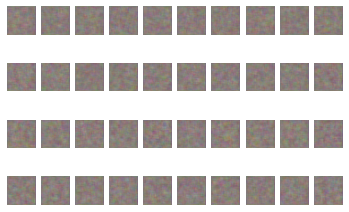

[0.14857831597328186, 0.953000009059906] 2.674697160720825
1:0 [D loss: 0.14857831597328186] [G loss: 2.674697160720825]


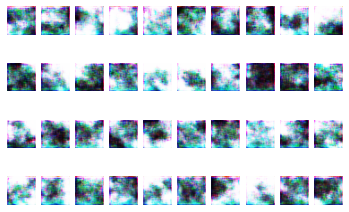

[0.06069386750459671, 0.9815000295639038] 0.8551668524742126
2:0 [D loss: 0.06069386750459671] [G loss: 0.8551668524742126]


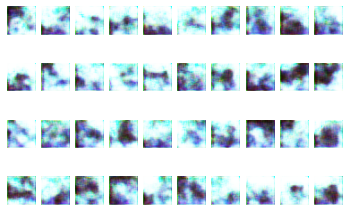

[0.04880367964506149, 0.9884999990463257] 0.7883343696594238
3:0 [D loss: 0.04880367964506149] [G loss: 0.7883343696594238]


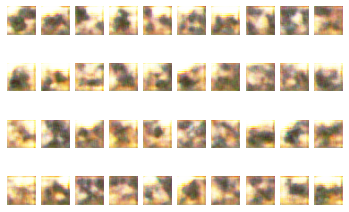

[0.029355278238654137, 0.9934999942779541] 0.5333999991416931
4:0 [D loss: 0.029355278238654137] [G loss: 0.5333999991416931]


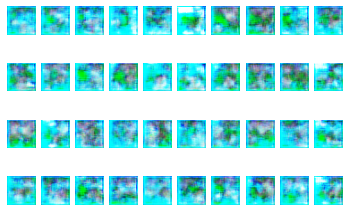

[0.09469753503799438, 0.968999981880188] 1.4180811643600464
5:0 [D loss: 0.09469753503799438] [G loss: 1.4180811643600464]


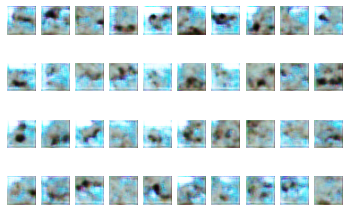

[0.048972900956869125, 0.987500011920929] 1.3229302167892456
6:0 [D loss: 0.048972900956869125] [G loss: 1.3229302167892456]


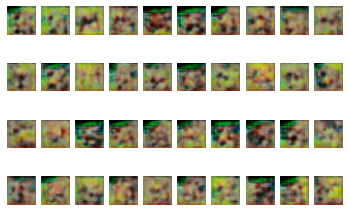

[0.03362797945737839, 0.9890000224113464] 1.1444289684295654
7:0 [D loss: 0.03362797945737839] [G loss: 1.1444289684295654]


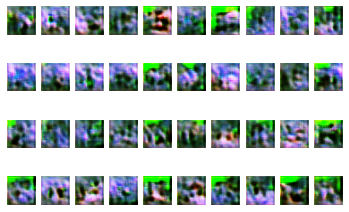

[0.008473321795463562, 0.9984999895095825] 0.16021253168582916
8:0 [D loss: 0.008473321795463562] [G loss: 0.16021253168582916]


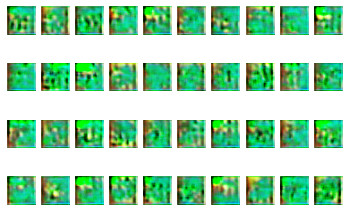

[0.17163583636283875, 0.9304999709129333] 2.751791000366211
9:0 [D loss: 0.17163583636283875] [G loss: 2.751791000366211]


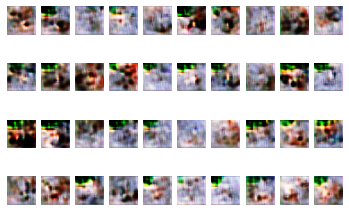

[0.051709700375795364, 0.9850000143051147] 4.557682991027832
10:0 [D loss: 0.051709700375795364] [G loss: 4.557682991027832]


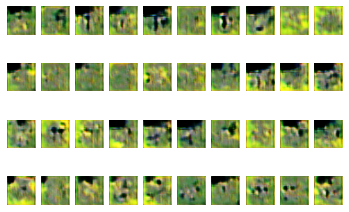

[0.04033849388360977, 0.9904999732971191] 4.102691173553467
11:0 [D loss: 0.04033849388360977] [G loss: 4.102691173553467]


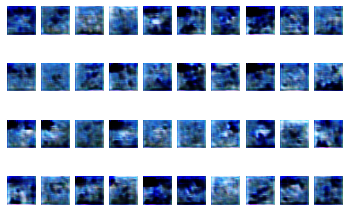

[0.12795668840408325, 0.9614999890327454] 1.0263686180114746
12:0 [D loss: 0.12795668840408325] [G loss: 1.0263686180114746]


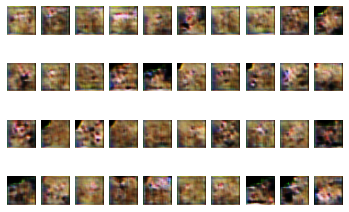

[0.0832802876830101, 0.9710000157356262] 2.7394278049468994
13:0 [D loss: 0.0832802876830101] [G loss: 2.7394278049468994]


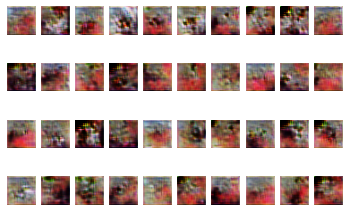

[0.03961336240172386, 0.9869999885559082] 3.422122001647949
14:0 [D loss: 0.03961336240172386] [G loss: 3.422122001647949]


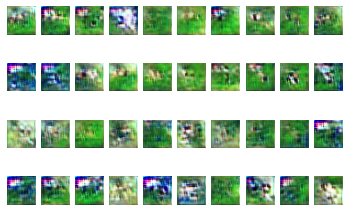

[0.045066948980093, 0.9879999756813049] 0.4613824784755707
15:0 [D loss: 0.045066948980093] [G loss: 0.4613824784755707]


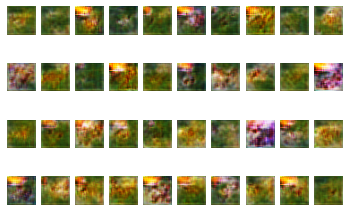

[0.16093815863132477, 0.9520000219345093] 3.097411870956421
16:0 [D loss: 0.16093815863132477] [G loss: 3.097411870956421]


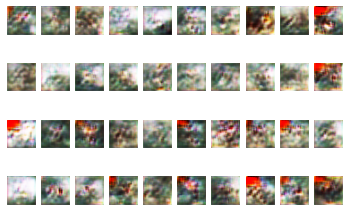

[0.1095573678612709, 0.9670000076293945] 5.216670513153076
17:0 [D loss: 0.1095573678612709] [G loss: 5.216670513153076]


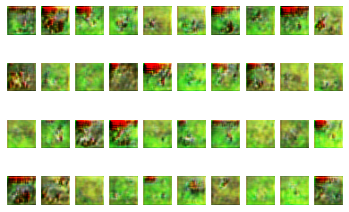

[0.0294791329652071, 0.9890000224113464] 0.41132110357284546
18:0 [D loss: 0.0294791329652071] [G loss: 0.41132110357284546]


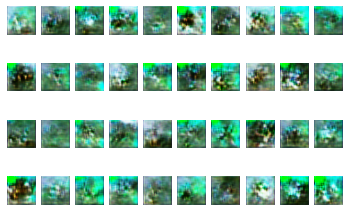

[0.11711800843477249, 0.9570000171661377] 4.066149711608887
19:0 [D loss: 0.11711800843477249] [G loss: 4.066149711608887]


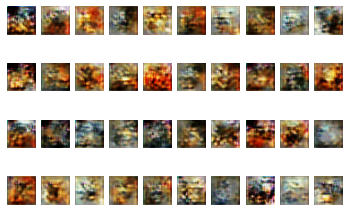

[0.12132061272859573, 0.9524999856948853] 4.563477993011475
20:0 [D loss: 0.12132061272859573] [G loss: 4.563477993011475]


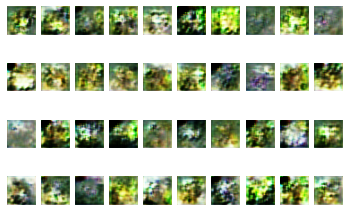

[0.153300940990448, 0.9434999823570251] 2.582498073577881
21:0 [D loss: 0.153300940990448] [G loss: 2.582498073577881]


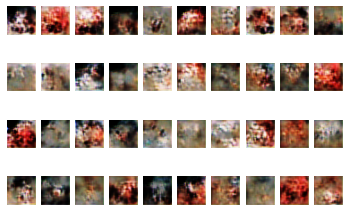

[0.08801042288541794, 0.9679999947547913] 1.8765310049057007
22:0 [D loss: 0.08801042288541794] [G loss: 1.8765310049057007]


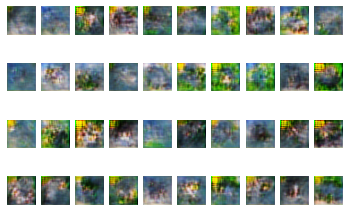

[0.1341555118560791, 0.9474999904632568] 4.024380207061768
23:0 [D loss: 0.1341555118560791] [G loss: 4.024380207061768]


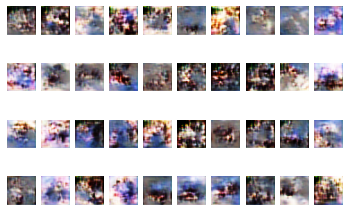

[0.2169533371925354, 0.9100000262260437] 2.625197649002075
24:0 [D loss: 0.2169533371925354] [G loss: 2.625197649002075]


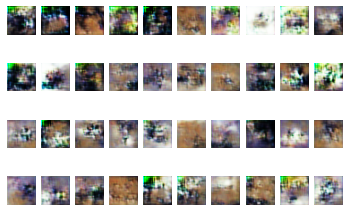

[0.3431466817855835, 0.8665000200271606] 1.222812294960022
25:0 [D loss: 0.3431466817855835] [G loss: 1.222812294960022]


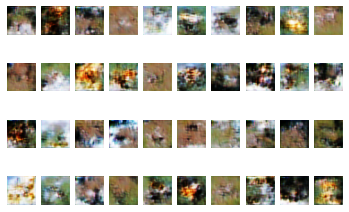

[0.13551022112369537, 0.953000009059906] 4.161102771759033
26:0 [D loss: 0.13551022112369537] [G loss: 4.161102771759033]


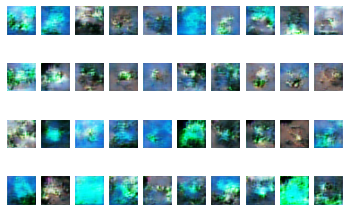

[0.1566382348537445, 0.9419999718666077] 1.9167381525039673
27:0 [D loss: 0.1566382348537445] [G loss: 1.9167381525039673]


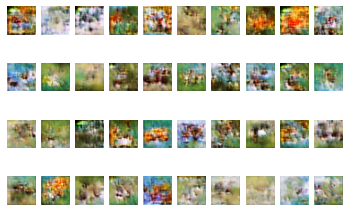

[0.16129718720912933, 0.9334999918937683] 2.8627445697784424
28:0 [D loss: 0.16129718720912933] [G loss: 2.8627445697784424]


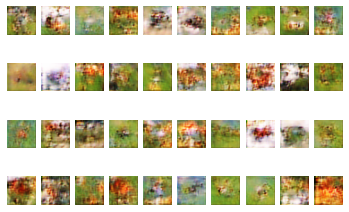

[0.24388819932937622, 0.8964999914169312] 3.090768814086914
29:0 [D loss: 0.24388819932937622] [G loss: 3.090768814086914]


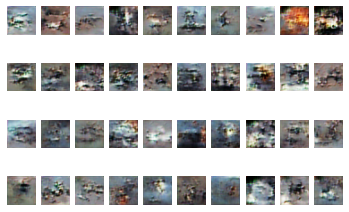

[0.27813470363616943, 0.8884999752044678] 1.2957417964935303
30:0 [D loss: 0.27813470363616943] [G loss: 1.2957417964935303]


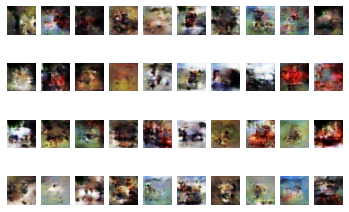

[0.3251672387123108, 0.8694999814033508] 1.3577691316604614
31:0 [D loss: 0.3251672387123108] [G loss: 1.3577691316604614]


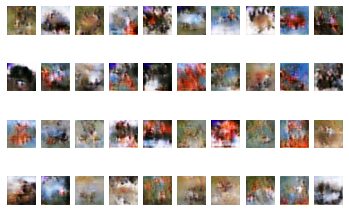

[0.31030094623565674, 0.862500011920929] 1.9622567892074585
32:0 [D loss: 0.31030094623565674] [G loss: 1.9622567892074585]


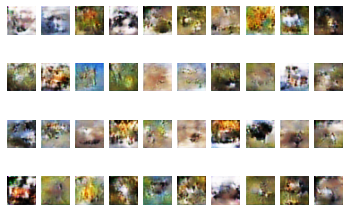

[0.4107862710952759, 0.8105000257492065] 1.6392366886138916
33:0 [D loss: 0.4107862710952759] [G loss: 1.6392366886138916]


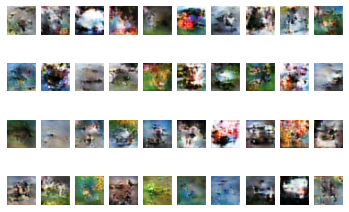

[0.2959718704223633, 0.8849999904632568] 1.3969731330871582
34:0 [D loss: 0.2959718704223633] [G loss: 1.3969731330871582]


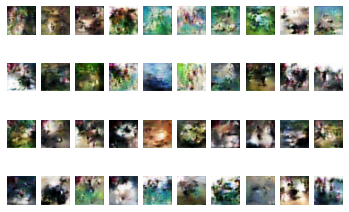

[0.2941499650478363, 0.8824999928474426] 2.2368247509002686
35:0 [D loss: 0.2941499650478363] [G loss: 2.2368247509002686]


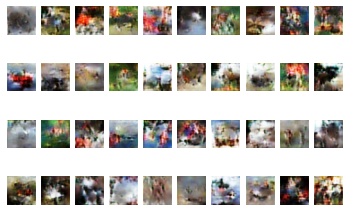

[0.3469406068325043, 0.8535000085830688] 1.7981719970703125
36:0 [D loss: 0.3469406068325043] [G loss: 1.7981719970703125]


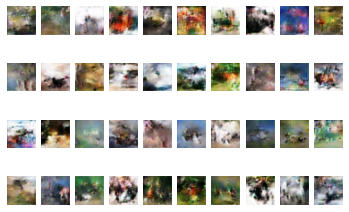

[0.1411544531583786, 0.949999988079071] 3.1512773036956787
37:0 [D loss: 0.1411544531583786] [G loss: 3.1512773036956787]


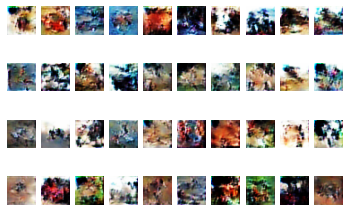

[0.34606215357780457, 0.8464999794960022] 1.094159722328186
38:0 [D loss: 0.34606215357780457] [G loss: 1.094159722328186]


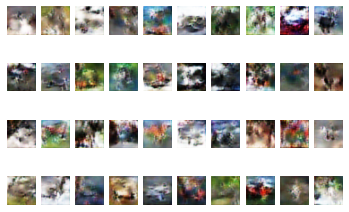

[0.359479695558548, 0.843999981880188] 1.4156297445297241
39:0 [D loss: 0.359479695558548] [G loss: 1.4156297445297241]


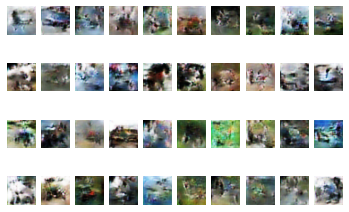

[0.35820263624191284, 0.8379999995231628] 2.1747488975524902
40:0 [D loss: 0.35820263624191284] [G loss: 2.1747488975524902]


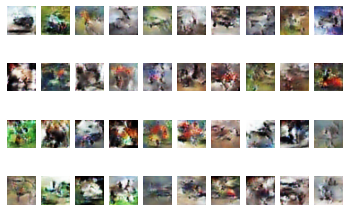

[0.33496201038360596, 0.8565000295639038] 1.7916547060012817
41:0 [D loss: 0.33496201038360596] [G loss: 1.7916547060012817]


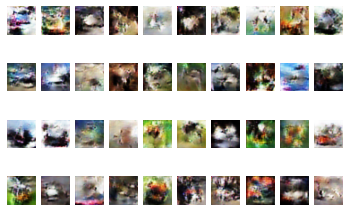

[0.33838701248168945, 0.840499997138977] 1.394010066986084
42:0 [D loss: 0.33838701248168945] [G loss: 1.394010066986084]


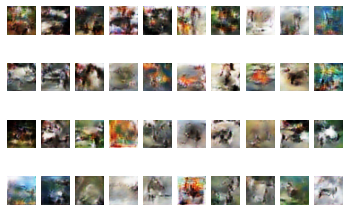

[0.3367033898830414, 0.8535000085830688] 1.848739504814148
43:0 [D loss: 0.3367033898830414] [G loss: 1.848739504814148]


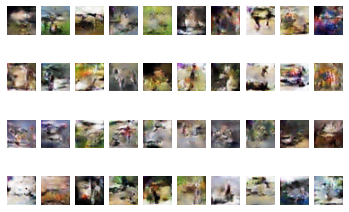

[0.3236580491065979, 0.859499990940094] 2.067087411880493
44:0 [D loss: 0.3236580491065979] [G loss: 2.067087411880493]


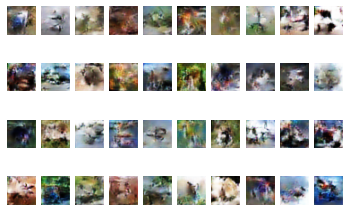

[0.3530943989753723, 0.8364999890327454] 2.0274224281311035
45:0 [D loss: 0.3530943989753723] [G loss: 2.0274224281311035]


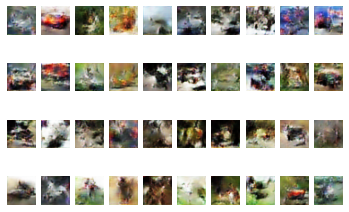

[0.35707852244377136, 0.8479999899864197] 1.302135944366455
46:0 [D loss: 0.35707852244377136] [G loss: 1.302135944366455]


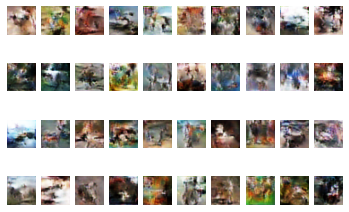

[0.3195708990097046, 0.8539999723434448] 2.059598207473755
47:0 [D loss: 0.3195708990097046] [G loss: 2.059598207473755]


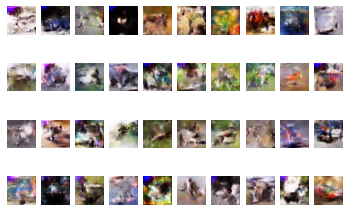

[0.28096917271614075, 0.8830000162124634] 1.2271145582199097
48:0 [D loss: 0.28096917271614075] [G loss: 1.2271145582199097]


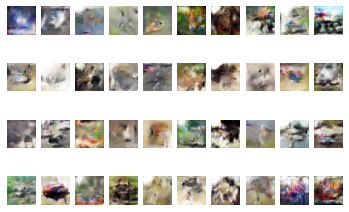

[0.32938072085380554, 0.8615000247955322] 1.8480286598205566
49:0 [D loss: 0.32938072085380554] [G loss: 1.8480286598205566]


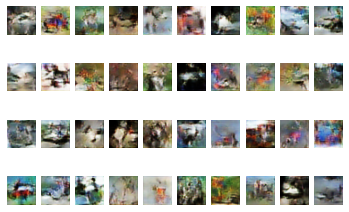

[0.3541682958602905, 0.8424999713897705] 1.8268064260482788
50:0 [D loss: 0.3541682958602905] [G loss: 1.8268064260482788]


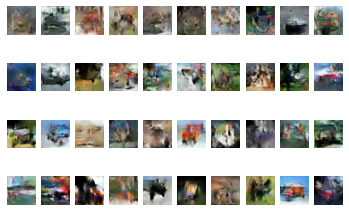

[0.3824036121368408, 0.8169999718666077] 1.6374655961990356
51:0 [D loss: 0.3824036121368408] [G loss: 1.6374655961990356]


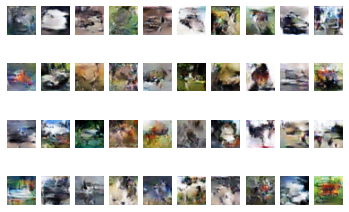

[0.2956427037715912, 0.8690000176429749] 2.1861069202423096
52:0 [D loss: 0.2956427037715912] [G loss: 2.1861069202423096]


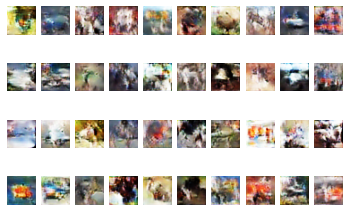

[0.31190478801727295, 0.8650000095367432] 1.7061642408370972
53:0 [D loss: 0.31190478801727295] [G loss: 1.7061642408370972]


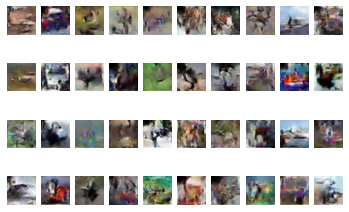

[0.3788244426250458, 0.8299999833106995] 1.7125608921051025
54:0 [D loss: 0.3788244426250458] [G loss: 1.7125608921051025]


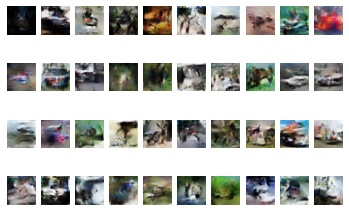

[0.3701869547367096, 0.8320000171661377] 1.8878034353256226
55:0 [D loss: 0.3701869547367096] [G loss: 1.8878034353256226]


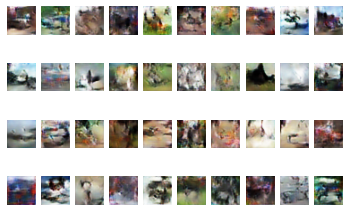

[0.33479559421539307, 0.8454999923706055] 1.8878661394119263
56:0 [D loss: 0.33479559421539307] [G loss: 1.8878661394119263]


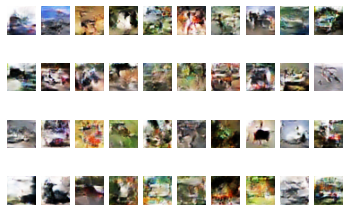

[0.3559231460094452, 0.8420000076293945] 1.7313534021377563
57:0 [D loss: 0.3559231460094452] [G loss: 1.7313534021377563]


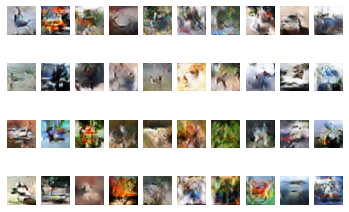

[0.3491993546485901, 0.8429999947547913] 1.6873209476470947
58:0 [D loss: 0.3491993546485901] [G loss: 1.6873209476470947]


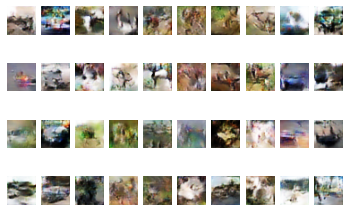

[0.3790583610534668, 0.8234999775886536] 2.0967905521392822
59:0 [D loss: 0.3790583610534668] [G loss: 2.0967905521392822]


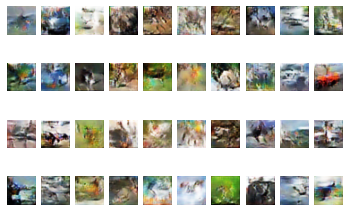

[0.36741673946380615, 0.8339999914169312] 1.651504635810852
60:0 [D loss: 0.36741673946380615] [G loss: 1.651504635810852]


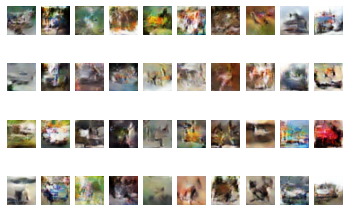

[0.4008539319038391, 0.8180000185966492] 1.5028486251831055
61:0 [D loss: 0.4008539319038391] [G loss: 1.5028486251831055]


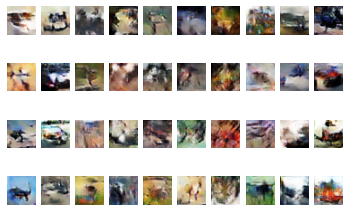

[0.3297557234764099, 0.8610000014305115] 1.9711748361587524
62:0 [D loss: 0.3297557234764099] [G loss: 1.9711748361587524]


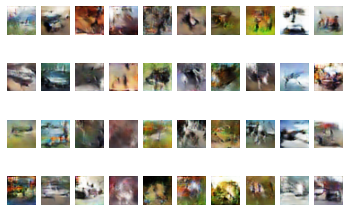

[0.27762097120285034, 0.8794999718666077] 2.643523931503296
63:0 [D loss: 0.27762097120285034] [G loss: 2.643523931503296]


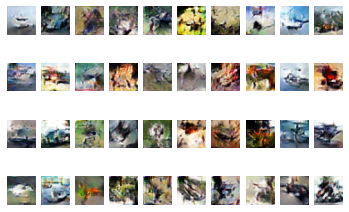

[0.23200799524784088, 0.9045000076293945] 2.604017496109009
64:0 [D loss: 0.23200799524784088] [G loss: 2.604017496109009]


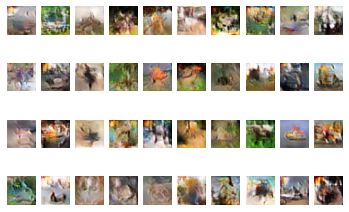

[0.3499293923377991, 0.8389999866485596] 1.9470378160476685
65:0 [D loss: 0.3499293923377991] [G loss: 1.9470378160476685]


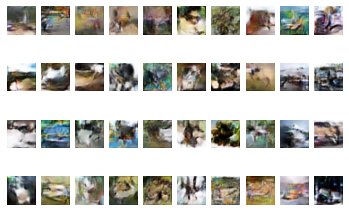

[0.37574273347854614, 0.8339999914169312] 1.733299732208252
66:0 [D loss: 0.37574273347854614] [G loss: 1.733299732208252]


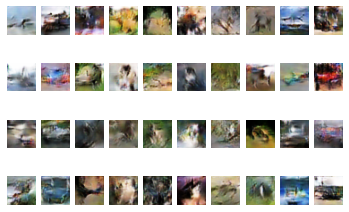

[0.3198157846927643, 0.8575000166893005] 1.7193868160247803
67:0 [D loss: 0.3198157846927643] [G loss: 1.7193868160247803]


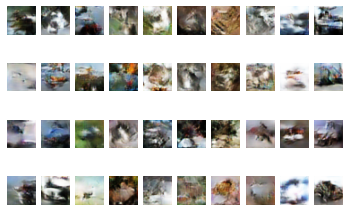

[0.3231715261936188, 0.8669999837875366] 1.9642541408538818
68:0 [D loss: 0.3231715261936188] [G loss: 1.9642541408538818]


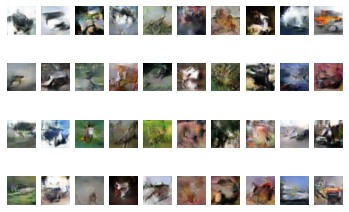

[0.3305835425853729, 0.8529999852180481] 2.2979652881622314
69:0 [D loss: 0.3305835425853729] [G loss: 2.2979652881622314]


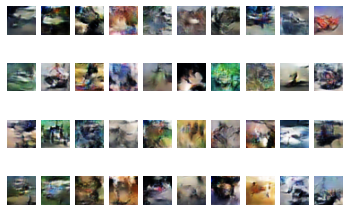

[0.3299567699432373, 0.8514999747276306] 1.9236185550689697
70:0 [D loss: 0.3299567699432373] [G loss: 1.9236185550689697]


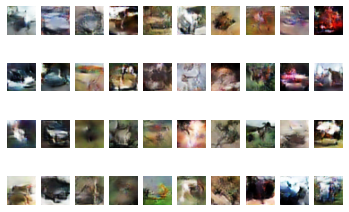

[0.3591720461845398, 0.8374999761581421] 1.7111997604370117
71:0 [D loss: 0.3591720461845398] [G loss: 1.7111997604370117]


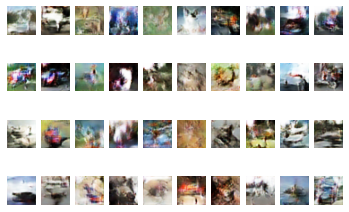

[0.34295323491096497, 0.8565000295639038] 1.8738654851913452
72:0 [D loss: 0.34295323491096497] [G loss: 1.8738654851913452]


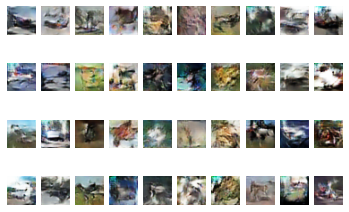

[0.3231256604194641, 0.8544999957084656] 1.5696008205413818
73:0 [D loss: 0.3231256604194641] [G loss: 1.5696008205413818]


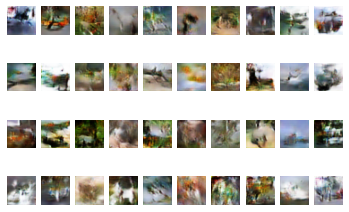

[0.34849706292152405, 0.8395000100135803] 2.180955648422241
74:0 [D loss: 0.34849706292152405] [G loss: 2.180955648422241]


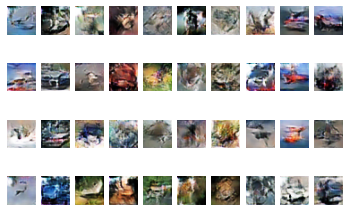

[0.37904083728790283, 0.8320000171661377] 1.9857008457183838
75:0 [D loss: 0.37904083728790283] [G loss: 1.9857008457183838]


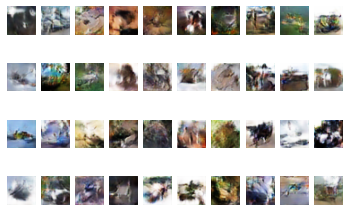

[0.3948672413825989, 0.8180000185966492] 1.9692302942276
76:0 [D loss: 0.3948672413825989] [G loss: 1.9692302942276]


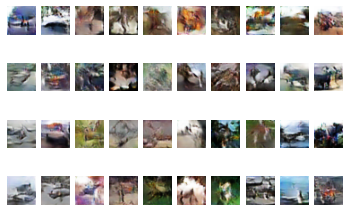

[0.3144735097885132, 0.8619999885559082] 1.8280647993087769
77:0 [D loss: 0.3144735097885132] [G loss: 1.8280647993087769]


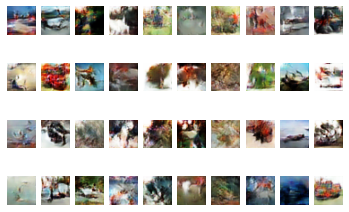

[0.3852713704109192, 0.8220000267028809] 1.5663710832595825
78:0 [D loss: 0.3852713704109192] [G loss: 1.5663710832595825]


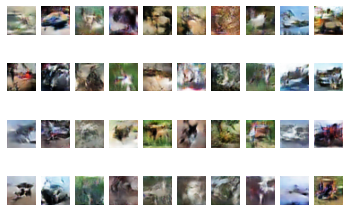

[0.37475255131721497, 0.828499972820282] 1.3787281513214111
79:0 [D loss: 0.37475255131721497] [G loss: 1.3787281513214111]


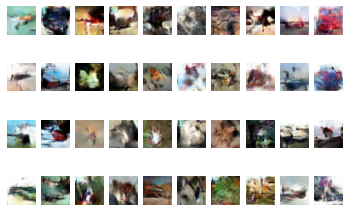

[0.3641045093536377, 0.8345000147819519] 1.9345598220825195
80:0 [D loss: 0.3641045093536377] [G loss: 1.9345598220825195]


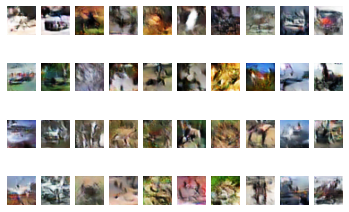

[0.3677196204662323, 0.840499997138977] 1.8880150318145752
81:0 [D loss: 0.3677196204662323] [G loss: 1.8880150318145752]


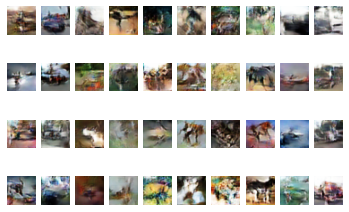

[0.3381911516189575, 0.8450000286102295] 1.9168882369995117
82:0 [D loss: 0.3381911516189575] [G loss: 1.9168882369995117]


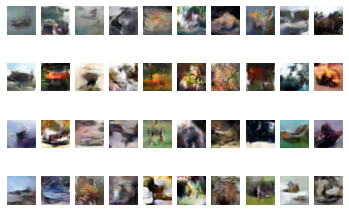

[0.26795539259910583, 0.8884999752044678] 2.4472668170928955
83:0 [D loss: 0.26795539259910583] [G loss: 2.4472668170928955]


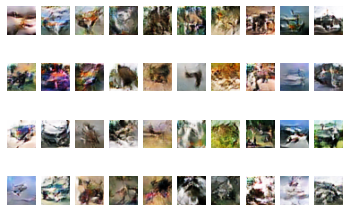

[0.31889808177948, 0.8684999942779541] 1.406786322593689
84:0 [D loss: 0.31889808177948] [G loss: 1.406786322593689]


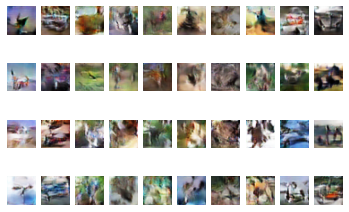

[0.3743830919265747, 0.828499972820282] 2.2628731727600098
85:0 [D loss: 0.3743830919265747] [G loss: 2.2628731727600098]


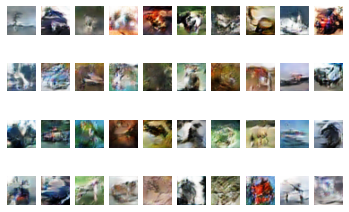

[0.3370400071144104, 0.8479999899864197] 1.6174730062484741
86:0 [D loss: 0.3370400071144104] [G loss: 1.6174730062484741]


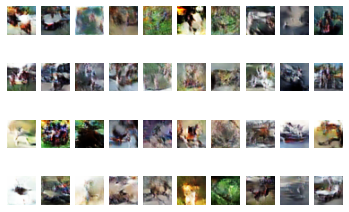

[0.3329527676105499, 0.8504999876022339] 1.7638957500457764
87:0 [D loss: 0.3329527676105499] [G loss: 1.7638957500457764]


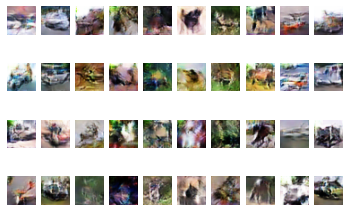

[0.2988479733467102, 0.8755000233650208] 2.0197038650512695
88:0 [D loss: 0.2988479733467102] [G loss: 2.0197038650512695]


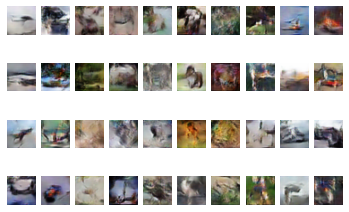

[0.3118768632411957, 0.8634999990463257] 2.0494039058685303
89:0 [D loss: 0.3118768632411957] [G loss: 2.0494039058685303]


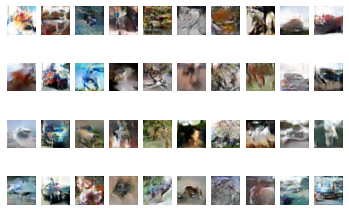

[0.30378755927085876, 0.8669999837875366] 1.5863741636276245
90:0 [D loss: 0.30378755927085876] [G loss: 1.5863741636276245]


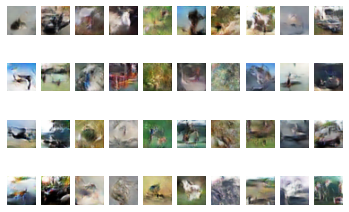

[0.3220248818397522, 0.8610000014305115] 1.6767714023590088
91:0 [D loss: 0.3220248818397522] [G loss: 1.6767714023590088]


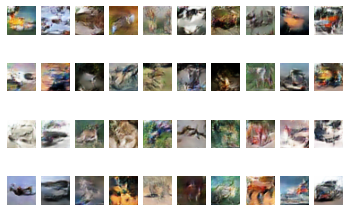

[0.3266768157482147, 0.8544999957084656] 2.026963710784912
92:0 [D loss: 0.3266768157482147] [G loss: 2.026963710784912]


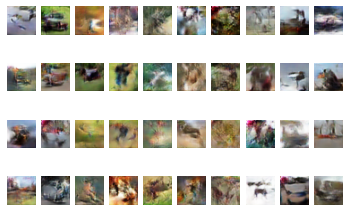

[0.33161625266075134, 0.8650000095367432] 1.7075581550598145
93:0 [D loss: 0.33161625266075134] [G loss: 1.7075581550598145]


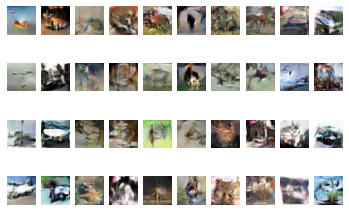

[0.3328053653240204, 0.8604999780654907] 1.6706746816635132
94:0 [D loss: 0.3328053653240204] [G loss: 1.6706746816635132]


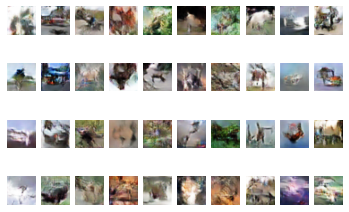

[0.30541443824768066, 0.8679999709129333] 1.6731958389282227
95:0 [D loss: 0.30541443824768066] [G loss: 1.6731958389282227]


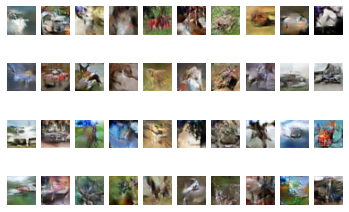

[0.2798435091972351, 0.890999972820282] 1.8521357774734497
96:0 [D loss: 0.2798435091972351] [G loss: 1.8521357774734497]


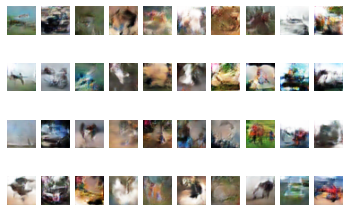

[0.3469091057777405, 0.8489999771118164] 3.0509252548217773
97:0 [D loss: 0.3469091057777405] [G loss: 3.0509252548217773]


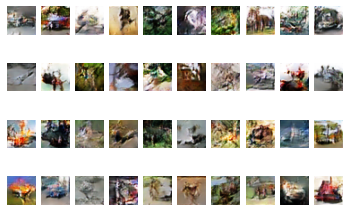

[0.31382060050964355, 0.8675000071525574] 1.7264336347579956
98:0 [D loss: 0.31382060050964355] [G loss: 1.7264336347579956]


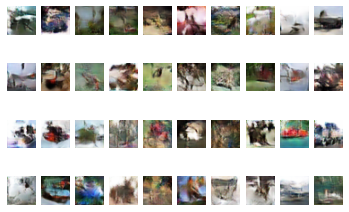

[0.2982722818851471, 0.8820000290870667] 1.6067790985107422
99:0 [D loss: 0.2982722818851471] [G loss: 1.6067790985107422]


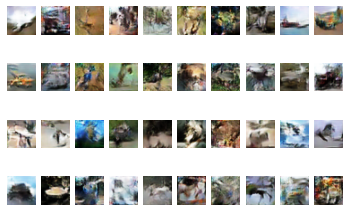

[0.32907634973526, 0.8600000143051147] 1.8580149412155151
100:0 [D loss: 0.32907634973526] [G loss: 1.8580149412155151]


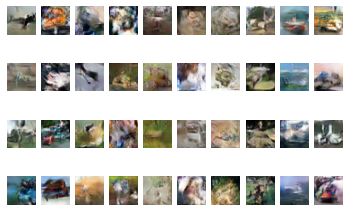

[0.3295995891094208, 0.8535000085830688] 1.701561450958252
101:0 [D loss: 0.3295995891094208] [G loss: 1.701561450958252]


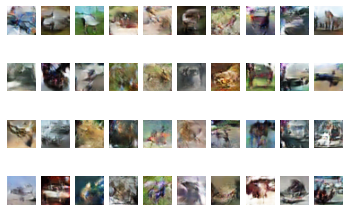

[0.31390833854675293, 0.8690000176429749] 1.7308845520019531
102:0 [D loss: 0.31390833854675293] [G loss: 1.7308845520019531]


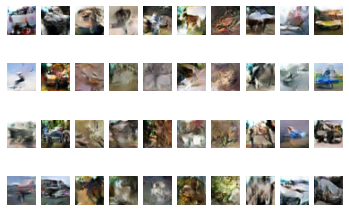

In [ ]:
train(train_data, train_label)